In [56]:
%reset

Once deleted, variables cannot be recovered. Proceed (y/[n])? y


In [57]:
#!/usr/bin/python
"""
Copyright 2019 Accenture and/or its affiliates.  All Rights Reserved.  
You may not use, copy, modify, and/or distribute this code and/or its documentation without permission from Accenture.
Please contact the Advanced Analytics-Operations Analytics team and/or Frode Huse Gjendem (lead) with any questions.

\brief This is the starter script for the Accenture's Health Datathon 2019 competition.

\version 1.0

\date $Date: 2019/05

"""

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt



'''
Function to select certain/uncertain weights
You will not need to ever create the following parameters
They are created (and this is called) within the next function "calc_weights"
@paramters
    patient_info: vector holding every month you want to evaluate, 1 for whichever column months_survived = 1, NA otherwise
    df_aux: vector that contains the probability of survival at each month, fixed values for a test set
@return
    the vector of weights

'''
def get_weights(patient_info, df_aux):
    x = np.array(patient_info)
    
    # weight will always be 1 if we know they are dead
    if (x[~np.isnan(x)][0]==1):
        x = np.ones_like(x)
    else:
        y = np.argwhere(~np.isnan(x))
        not_zero_index = y.ravel()[0]
        
        x[:not_zero_index] = 1
        x[not_zero_index:] = df_aux['prob'][not_zero_index:]
    return (x)


'''
Function to calculate the weight matrix
@paramters
    y_df: The test set for which you are calculating the weights
        Format: Index = ID, Rows = patients, cols = ['specific_death', 'months_survival']
@ return
    the weights matrix with the weights for each patient at each time t  
'''
def calc_weights(y_df):
    
    # Create a matrix with patient id in the index and months_survival as header, specific_death as values.   
    df_y_pivot = y_df.pivot(columns="months_survival", values='specific_death')
    # The table changes order of rows after pivoting it, we need to reorder it again by doing reindex_axis.
    df_y_pivot= df_y_pivot.reindex(y_df.index, axis=0).reset_index()
    
    # We need to calculate the weights based on the entire time initially, then cut it off after the fact
    all_months_survival = np.arange(0,y_df.months_survival.max()+1)
    months_complementary = np.setdiff1d(all_months_survival, y_df.months_survival.unique())
    df_complementary = pd.DataFrame(np.nan, index=df_y_pivot.index, columns=months_complementary )
    df_y_pivot = pd.concat([df_y_pivot,df_complementary],axis=1)[all_months_survival]
    
    # Get aux matrix to provide in the get_weights function. 
    # Probability of being alive at each month based on patients you are certain about (excluding patients censored pior to month)
    df_aux = pd.DataFrame(data=np.arange(0,y_df.months_survival.max()+1),columns=["months_survival"])
    df_aux['prob_num'] = df_aux['months_survival'].apply(lambda x : (y_df['months_survival'] > x).values.sum())
    df_aux['prob_den'] = df_aux['months_survival'].apply(lambda x : ((y_df['months_survival'] < x) & (y_df['specific_death']==1)).values.sum())
    df_aux['prob'] = (df_aux['prob_num']/(df_aux['prob_num']+df_aux['prob_den']))

    df_aux = df_aux[['months_survival','prob']].sort_values('months_survival').reset_index().drop('index',axis=1)

    
    #Get weights
    df_weights = df_y_pivot.apply(lambda x: get_weights(x,df_aux),axis=1)
    
    new_weights = pd.DataFrame(np.vstack(df_weights),columns=all_months_survival )

    new_weights = np.apply_along_axis(np.cumprod, 1, new_weights)
    
    new_weights = pd.DataFrame(new_weights)
    
    return new_weights


''' 
Fill up the Y_true matrix's value 
You will not need to ever creat the following parameter.
It is created (and this is called) within the next function "populate_actual".
@paramters
    patient_info: vector holding every month you want to evaluate, 1 for whichever column months_survived = 1, NA otherwise
'''
def apply_non_zero(patient_info):
    x = np.array(patient_info)
    if (x[~np.isnan(x)][0]==0):
        x = np.ones_like(x)
    else:
        y = np.argwhere(~np.isnan(x))
        not_zero_index = y.ravel()[0]
        x[:(not_zero_index)] = 1
        x[(not_zero_index):] = 0   

    return (pd.Series(x))

 
'''
Build the Y_true matrix
@paramters
    y_df: The test set for which you are calculating the weights
        Format: Index = ID, Rows = patients, cols = ['specific_death', 'months_survival']
    years: Number of years for which you want to evaluate your model. Default = 10.
'''
def populate_actual(y_df, years = 10):
    #Create a matrix by pivoting table
    df_y_true_pivot = y_df.pivot(columns = "months_survival", values='specific_death')
    #The table changes order of rows after pivoting it, we need to reorder it again by doing reindex_axis.
    df_y_true_pivot = df_y_true_pivot.reindex(y_df.index, axis=0).reset_index()


    all_months_survival = np.arange(0,y_df.months_survival.max()+1)
    #Get the month that we don't have any patient record in our dataset.
    
    months_complementary = np.setdiff1d(all_months_survival, y_df.months_survival.unique())
    df_complementary = pd.DataFrame(np.nan, index=df_y_true_pivot.index, columns=months_complementary )
    
    #Add the complementary dataframe to create a full-month dataframe
    df_y_true_pivot = pd.concat([df_y_true_pivot,df_complementary],axis=1)[all_months_survival]

    # Fill NaN value to either 0 or 1
    df_y_pro = df_y_true_pivot.apply(lambda x: apply_non_zero(x),axis=1)
    
    
    chosen_months_survival = np.arange(0,years*12+1)
    df_y_pro = df_y_pro[chosen_months_survival].values
    
    return df_y_pro


'''
Function to compute the weighted Brier score
@paramters
    pred: is the prediction matrix
        Format: Index = ID, Rows = patients, cols = months, values = probability of being alive (alive = 1, dead = 0)
    actual: is the actual value matrix.
        Format: Index = ID, Rows = patients, cols = ['specific_death', 'months_survival']
    weights: is the matrix of weights associated to the predictions
    years_cutoff: is the time for which the error is computed
@return
    the vector of actual status over time
'''
def brier_score_loss_weighted(pred, actual, weights, years_cutoff = 10):
    
    # Select the desired period
    weights = weights.iloc[:,:(12*years_cutoff)+1]
    
    # obtain the unique time values in the y data of your survival data
    unique_times = range(0, (12*years_cutoff)+1)
    
    # fill an empty matrix to hold the weights
    errors = np.empty([len(actual), len(unique_times)])
    
    # subset y_pred to be the number of years you want
    m_y_pred = pred.iloc[:,:(max(unique_times)+1)]

    try:
        m_y_true = np.matrix(populate_actual(actual, years_cutoff))
        m_y_pred = np.matrix(m_y_pred)
        m_weights = np.matrix(weights)
    except:
        print("Matrix format is required for y_true, y_predict and weights")
            
    errors = np.multiply(np.power(m_y_pred - m_y_true,2),m_weights)
    
    error = pd.DataFrame(errors)
    time = years_cutoff * 12
    
    # calculate the average error of all patients for each time
    all_dates = error.mean(axis=0)
    
    # subset desired dates
    desired_dates = pd.DataFrame(all_dates[0:(time+1)])
    
    # calculate the average error up until a point in time
    desired_error = np.mean(desired_dates)
    
    return desired_error

In [58]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
from plotly import tools
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go

import datetime
import random

import re
sns.set()

from scipy.stats.mstats import winsorize
import scipy.stats
import pandas as pd
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)


#%matplotlib notebook
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sksurv.preprocessing import OneHotEncoder
from sksurv.linear_model import CoxPHSurvivalAnalysis
from sksurv.ensemble import GradientBoostingSurvivalAnalysis
from sksurv.linear_model import CoxnetSurvivalAnalysis
from sklearn.preprocessing import StandardScaler

In [59]:
df = pd.read_csv("./numeric_full.csv",  index_col='ID')



In [60]:
df.visceral_metastasis_location_ENCODEDmonths_survival.fillna(0,inplace=True)

df.visceral_metastasis_location_ENCODEDspecific_death.fillna(0,inplace=True)


In [61]:
x=df.drop(columns=['specific_death', 'months_survival'])
y=df[['specific_death','months_survival','train']]

In [62]:
x = x._get_numeric_data()

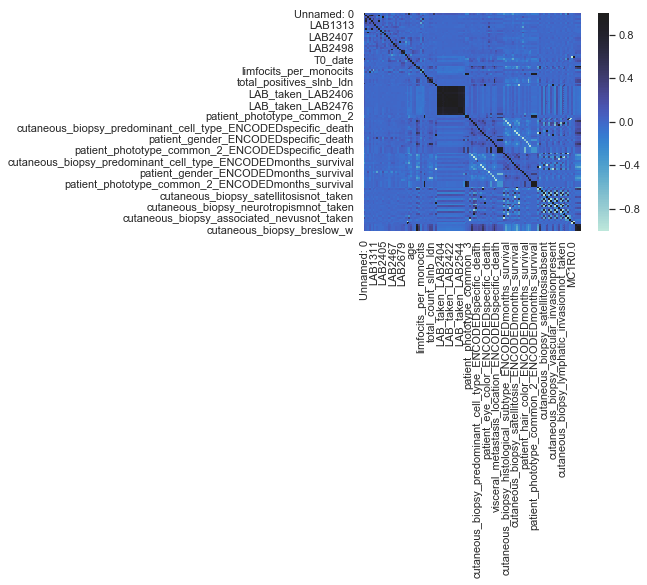

In [63]:
sns.heatmap(x.corr(),center=True,square=True);

In [64]:
x.shape

(3068, 115)

In [65]:
x[~x.isin([np.nan, np.inf, -np.inf]).any(1)]

,Unnamed: 0,LAB1300,LAB1301,LAB1307,LAB1309,LAB1311,LAB1313,LAB1314,LAB1316,LAB2404,LAB2405,LAB2406,LAB2407,LAB2419,LAB2422,LAB2467,LAB2469,LAB2476,LAB2498,LAB2544,LAB2679,LAB4176,LABGF_filtrat_glomerular,MC1R,T0_date,age,count_inv_prec_tumour,count_situ_prec_tumour,cutaneous_biopsy_breslow,cutaneous_biopsy_mitotic_index,limfocits_per_monocits,neutrofils_per_limfocits,patient_phototype,random,slnb_ldn_location_total,total_count_slnb_ldn,total_positives_slnb_ldn,train,paso_previo_metastasis,LAB_taken_13,LAB_taken_LAB2404,LAB_taken_LAB2405,LAB_taken_LAB2406,LAB_taken_LAB2407,LAB_taken_LAB2419,LAB_taken_LAB2422,LAB_taken_LAB2467,LAB_taken_LAB2469,LAB_taken_LAB2476,LAB_taken_LAB2498,LAB_taken_LAB2544,LAB_taken_LAB2679,LAB_taken_LAB4176,LAB_taken_LABGF_filtrat_glomerular,patient_phototype_common_2,patient_phototype_common_3,cutaneous_biopsy_associated_nevus_ENCODEDspecific_death,cutaneous_biopsy_histological_subtype_ENCODEDspecific_death,cutaneous_biopsy_lymphatic_invasion_ENCODEDspecific_death,cutaneous_biopsy_neurotropism_ENCODEDspecific_death,cutaneous_biopsy_predominant_cell_type_ENCODEDspecific_death,cutaneous_biopsy_regression_ENCODEDspecific_death,cutaneous_biopsy_satellitosis_ENCODEDspecific_death,cutaneous_biopsy_ulceration_ENCODEDspecific_death,cutaneous_biopsy_vascular_invasion_ENCODEDspecific_death,patient_eye_color_ENCODEDspecific_death,patient_gender_ENCODEDspecific_death,patient_hair_color_ENCODEDspecific_death,primary_tumour_location_coded_ENCODEDspecific_death,scenario_ENCODEDspecific_death,visceral_metastasis_location_ENCODEDspecific_death,patient_phototype_unk_ENCODEDspecific_death,patient_phototype_common_2_ENCODEDspecific_death,patient_phototype_common_3_ENCODEDspecific_death,cutaneous_biopsy_associated_nevus_ENCODEDmonths_survival,cutaneous_biopsy_histological_subtype_ENCODEDmonths_survival,cutaneous_biopsy_lymphatic_invasion_ENCODEDmonths_survival,cutaneous_biopsy_neurotropism_ENCODEDmonths_survival,cutaneous_biopsy_predominant_cell_type_ENCODEDmonths_survival,cutaneous_biopsy_regression_ENCODEDmonths_survival,cutaneous_biopsy_satellitosis_ENCODEDmonths_survival,cutaneous_biopsy_ulceration_ENCODEDmonths_survival,cutaneous_biopsy_vascular_invasion_ENCODEDmonths_survival,patient_eye_color_ENCODEDmonths_survival,patient_gender_ENCODEDmonths_survival,patient_hair_color_ENCODEDmonths_survival,primary_tumour_location_coded_ENCODEDmonths_survival,scenario_ENCODEDmonths_survival,visceral_metastasis_location_ENCODEDmonths_survival,patient_phototype_unk_ENCODEDmonths_survival,patient_phototype_common_2_ENCODEDmonths_survival,patient_phototype_common_3_ENCODEDmonths_survival,cutaneous_biopsy_ulcerationabsent,cutaneous_biopsy_ulcerationpresent,cutaneous_biopsy_ulcerationnot_taken,cutaneous_biopsy_satellitosisabsent,cutaneous_biopsy_satellitosisnot_taken,cutaneous_biopsy_satellitosispresent,cutaneous_biopsy_vascular_invasionabsent,cutaneous_biopsy_vascular_invasionnot_taken,cutaneous_biopsy_vascular_invasionpresent,cutaneous_biopsy_neurotropismabsent,cutaneous_biopsy_neurotropismnot_taken,cutaneous_biopsy_neurotropismpresent,cutaneous_biopsy_lymphatic_invasionabsent,cutaneous_biopsy_lymphatic_invasionnot_taken,cutaneous_biopsy_lymphatic_invasionpresent,cutaneous_biopsy_associated_nevusabsent,cutaneous_biopsy_associated_nevusnot_taken,cutaneous_biopsy_associated_nevuspresent,MC1R0.0,MC1R1.0,cutaneous_biopsy_breslow_bin,cutaneous_biopsy_breslow_bin_ENCODEDspecific_death,cutaneous_biopsy_breslow_w
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ID2,0,6.600000,260.00000,4.200000,1.840000,0.190000,0.280000,13.400000,0.020000,21.00000,260.00000,17.000000,0.400000,308.000000,95.000000,0.800000,320.000000,72.000000,65.000000,1.600000,0.120000,7.000000,76.692145,0.0,75,64.251366,0.0,0.0,0.90,0.0,9.684211,2.282609,2.0,4,1.0,1.0,0.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2.0,2.0,0.173196,0.102456,0.144524,0.155462,0.163607,0.060773,0.161828,0.099157,0.163685,0.197849,0

In [66]:
x.shape

(3068, 115)

In [67]:
train = x[x['train'] == 1]
test = x[x['train'] == 0]

In [68]:
# Feature selection
b_x_train = train.drop(columns='train')
b_y_train = y.query('train==1')[['specific_death', 'months_survival']]

In [69]:
b_test = test.drop(columns='train')

In [70]:
b_y_train.isnull().sum()

specific_death     0
months_survival    0
dtype: int64

In [71]:
def fit_and_prepare(x_train, y_train, test_df):
    
    # 3.1. Prepare Y-----
    y_train.specific_death = y_train.specific_death.astype(bool)
    
    # Transform it into a structured array
    y_train = y_train.to_records(index = False)
    
    # 3.2. Prepare X-----
    # obtain the x variables that are categorical
    categorical_feature_mask = x_train.dtypes==object

    # Filter categorical columns using mask and turn it into a list
    categorical_cols = x_train.columns[categorical_feature_mask].tolist()

    # Ensure categorical columns are category type
    for col in categorical_cols:
        x_train[col] = x_train[col].astype('category')
        test_df[col] = test_df[col].astype('category')
    
    # 3.3. Fit model-----
    # initiate
    encoder = OneHotEncoder()
    estimator = CoxnetSurvivalAnalysis(fit_baseline_model=True)
    
    # fit model
    estimator.fit(encoder.fit_transform(x_train), y_train)
    
    # transform the test variables to match the train
    x_test = encoder.transform(test_df)
    
    return (estimator, x_test, x_train, y_train)

In [72]:
test.isna().sum().sum()


0

In [73]:
b_x_train.isna().sum().sum()


0

In [74]:
b_y_train.isna().sum().sum()

0

In [75]:
estimator, x_test, x_train, y_train = fit_and_prepare(b_x_train,b_y_train, test)

In [76]:
estimator_b, x_test_b, x_train_b, y_train_b = fit_and_prepare(b_x_train, b_y_train, b_test)

In [77]:
pred_surv = estimator.predict(x_test)
pred_surv[0]

-17.797351428740246

In [78]:
x_test.head()

,Unnamed: 0,LAB1300,LAB1301,LAB1307,LAB1309,LAB1311,LAB1313,LAB1314,LAB1316,LAB2404,LAB2405,LAB2406,LAB2407,LAB2419,LAB2422,LAB2467,LAB2469,LAB2476,LAB2498,LAB2544,LAB2679,LAB4176,LABGF_filtrat_glomerular,MC1R,T0_date,age,count_inv_prec_tumour,count_situ_prec_tumour,cutaneous_biopsy_breslow,cutaneous_biopsy_mitotic_index,limfocits_per_monocits,neutrofils_per_limfocits,patient_phototype,random,slnb_ldn_location_total,total_count_slnb_ldn,total_positives_slnb_ldn,paso_previo_metastasis,LAB_taken_13,LAB_taken_LAB2404,LAB_taken_LAB2405,LAB_taken_LAB2406,LAB_taken_LAB2407,LAB_taken_LAB2419,LAB_taken_LAB2422,LAB_taken_LAB2467,LAB_taken_LAB2469,LAB_taken_LAB2476,LAB_taken_LAB2498,LAB_taken_LAB2544,LAB_taken_LAB2679,LAB_taken_LAB4176,LAB_taken_LABGF_filtrat_glomerular,patient_phototype_common_2,patient_phototype_common_3,cutaneous_biopsy_associated_nevus_ENCODEDspecific_death,cutaneous_biopsy_histological_subtype_ENCODEDspecific_death,cutaneous_biopsy_lymphatic_invasion_ENCODEDspecific_death,cutaneous_biopsy_neurotropism_ENCODEDspecific_death,cutaneous_biopsy_predominant_cell_type_ENCODEDspecific_death,cutaneous_biopsy_regression_ENCODEDspecific_death,cutaneous_biopsy_satellitosis_ENCODEDspecific_death,cutaneous_biopsy_ulceration_ENCODEDspecific_death,cutaneous_biopsy_vascular_invasion_ENCODEDspecific_death,patient_eye_color_ENCODEDspecific_death,patient_gender_ENCODEDspecific_death,patient_hair_color_ENCODEDspecific_death,primary_tumour_location_coded_ENCODEDspecific_death,scenario_ENCODEDspecific_death,visceral_metastasis_location_ENCODEDspecific_death,patient_phototype_unk_ENCODEDspecific_death,patient_phototype_common_2_ENCODEDspecific_death,patient_phototype_common_3_ENCODEDspecific_death,cutaneous_biopsy_associated_nevus_ENCODEDmonths_survival,cutaneous_biopsy_histological_subtype_ENCODEDmonths_survival,cutaneous_biopsy_lymphatic_invasion_ENCODEDmonths_survival,cutaneous_biopsy_neurotropism_ENCODEDmonths_survival,cutaneous_biopsy_predominant_cell_type_ENCODEDmonths_survival,cutaneous_biopsy_regression_ENCODEDmonths_survival,cutaneous_biopsy_satellitosis_ENCODEDmonths_survival,cutaneous_biopsy_ulceration_ENCODEDmonths_survival,cutaneous_biopsy_vascular_invasion_ENCODEDmonths_survival,patient_eye_color_ENCODEDmonths_survival,patient_gender_ENCODEDmonths_survival,patient_hair_color_ENCODEDmonths_survival,primary_tumour_location_coded_ENCODEDmonths_survival,scenario_ENCODEDmonths_survival,visceral_metastasis_location_ENCODEDmonths_survival,patient_phototype_unk_ENCODEDmonths_survival,patient_phototype_common_2_ENCODEDmonths_survival,patient_phototype_common_3_ENCODEDmonths_survival,cutaneous_biopsy_ulcerationabsent,cutaneous_biopsy_ulcerationpresent,cutaneous_biopsy_ulcerationnot_taken,cutaneous_biopsy_satellitosisabsent,cutaneous_biopsy_satellitosisnot_taken,cutaneous_biopsy_satellitosispresent,cutaneous_biopsy_vascular_invasionabsent,cutaneous_biopsy_vascular_invasionnot_taken,cutaneous_biopsy_vascular_invasionpresent,cutaneous_biopsy_neurotropismabsent,cutaneous_biopsy_neurotropismnot_taken,cutaneous_biopsy_neurotropismpresent,cutaneous_biopsy_lymphatic_invasionabsent,cutaneous_biopsy_lymphatic_invasionnot_taken,cutaneous_biopsy_lymphatic_invasionpresent,cutaneous_biopsy_associated_nevusabsent,cutaneous_biopsy_associated_nevusnot_taken,cutaneous_biopsy_associated_nevuspresent,MC1R0.0,MC1R1.0,cutaneous_biopsy_breslow_bin,cutaneous_biopsy_breslow_bin_ENCODEDspecific_death,cutaneous_biopsy_breslow_w
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ID108,0,3.400000,244.00000,0.800000,2.190000,0.270000,0.010000,12.500000,0.030000,20.00000,244.00000,14.000000,0.300000,338.722488,92.000000,1.000000,181.000000,99.000000,71.000000,1.400000,0.040000,6.700000,66.861022,0.0,71,35.519126,0.0,0.0,0.50,0.0,8.111111,0.365297,2.0,4,1.0,3.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,2.0,2.0,0.173196,0.102456,0.144524,0.155462,0.163607,0.202999,0.161828,0.099157,0.163685,0.197849,0.139947

In [79]:
def get_probabilities(x_test, estimator):
    
    pred_surv = estimator.predict_survival_function(x_test)

    # Get the "X's" or time of each data point
    times = pred_surv[0].x

    # Create an empty pandas dataframes with these times as the columns
    pred_df = pd.DataFrame(columns = times)

    # Convert each row to a pandas series row (transpose) with the index as these x times and append it to the df
    for i in range(0, len(x_test)):
        pred_df = pred_df.append(pd.DataFrame(pred_surv[i].y).set_index(times).T) 

    pred_df = pred_df.set_index(x_test.index)

    return pred_df

In [80]:
# 4.2 store the predictions
predictions_b = get_probabilities(x_test_b, estimator_b)

In [81]:
y_train

rec.array([(False, 179.), (False, 127.), (False,  67.), ...,
           (False, 102.), (False,  66.), (False,  79.)],
          dtype=[('specific_death', '?'), ('months_survival', '<f8')])

In [82]:
predictions_b

,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,15.0,16.0,17.0,18.0,19.0,20.0,21.0,22.0,23.0,24.0,25.0,26.0,27.0,28.0,29.0,30.0,31.0,32.0,33.0,34.0,35.0,36.0,37.0,38.0,39.0,40.0,41.0,42.0,43.0,44.0,45.0,46.0,47.0,48.0,49.0,50.0,51.0,52.0,53.0,54.0,55.0,56.0,57.0,58.0,59.0,60.0,61.0,62.0,63.0,64.0,65.0,66.0,67.0,68.0,69.0,70.0,71.0,72.0,73.0,74.0,75.0,76.0,77.0,78.0,79.0,80.0,81.0,82.0,83.0,84.0,85.0,86.0,87.0,88.0,89.0,90.0,91.0,92.0,93.0,94.0,95.0,96.0,97.0,98.0,99.0,100.0,101.0,102.0,103.0,104.0,105.0,106.0,107.0,108.0,109.0,110.0,111.0,112.0,113.0,114.0,115.0,116.0,117.0,118.0,119.0,120.0,121.0,122.0,123.0,124.0,125.0,126.0,127.0,128.0,129.0,130.0,131.0,132.0,133.0,134.0,135.0,136.0,137.0,138.0,139.0,140.0,141.0,142.0,143.0,144.0,145.0,146.0,147.0,148.0,149.0,150.0,151.0,152.0,153.0,154.0,155.0,156.0,157.0,158.0,159.0,160.0,161.0,162.0,163.0,164.0,165.0,166.0,167.0,168.0,169.0,170.0,171.0,172.0,173.0,174.0,175.0,176.0,177.0,178.0,179.0,180.0,181.0,182.0,183.0,184.0,185.0,186.0,187.0,188.0,189.0,190.0,191.0,192.0,193.0,194.0,195.0,196.0,197.0,198.0,199.0,200.0,201.0,202.0,203.0,204.0,205.0,206.0,207.0,208.0,209.0,210.0,211.0,212.0,213.0,214.0,215.0,216.0,217.0,218.0,219.0,220.0,221.0,222.0,223.0,224.0,225.0,226.0,227.0,228.0,229.0,230.0,231.0,232.0,233.0,234.0,235.0,236.0,237.0,238.0,239.0,240.0,241.0,242.0,243.0,244.0,245.0,246.0,247.0,248.0,249.0,250.0,251.0,252.0,253.0
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ID108,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
ID134,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.

In [83]:
# 4.3 Compute estimate of the survival curves
pred_curves = estimator_b.predict_survival_function(x_test_b)

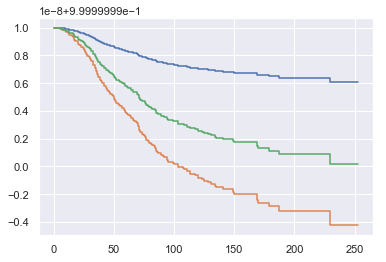

In [84]:
for curve in pred_curves[0:3]:
    plt.step(curve.x, curve.y, where="post")

In [85]:
from sksurv.metrics import concordance_index_censored

prediction = estimator.predict(x_train)
result = concordance_index_censored(y_train['specific_death'], 
                                    y_train["months_survival"],
                                    prediction)
result[0]

0.8500261325969672

In [86]:
from sksurv.metrics import concordance_index_censored

pred_b = estimator_b.predict(x_train_b)
result = concordance_index_censored(y_train_b['specific_death'], 
                                    y_train_b["months_survival"],
                                    pred_b)
result[0]

0.8500261325969672

In [87]:
predictions_df = pd.DataFrame(predictions_b)

In [88]:

# Please, remember that rows NEED TO BE indexed by patient IDs and columns MUST be ordered from T0 to T120

# First subset to 10 years
predictions_10yr = predictions_df.iloc[:,:121]

#Rename columns to Time periods
columns = predictions_10yr.columns.values
new_columns = ['T' + str(s) for s in columns]
predictions_10yr.columns = new_columns

# Write the final CSV file
# Please, remember than in order to make the submission you need to create a .zip file ONLY with the csv
pd.DataFrame(predictions_10yr).to_csv('sample-submission-cox.csv')

In [89]:
predictions_df.index = test.index
predictions_df

,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,15.0,16.0,17.0,18.0,19.0,20.0,21.0,22.0,23.0,24.0,25.0,26.0,27.0,28.0,29.0,30.0,31.0,32.0,33.0,34.0,35.0,36.0,37.0,38.0,39.0,40.0,41.0,42.0,43.0,44.0,45.0,46.0,47.0,48.0,49.0,50.0,51.0,52.0,53.0,54.0,55.0,56.0,57.0,58.0,59.0,60.0,61.0,62.0,63.0,64.0,65.0,66.0,67.0,68.0,69.0,70.0,71.0,72.0,73.0,74.0,75.0,76.0,77.0,78.0,79.0,80.0,81.0,82.0,83.0,84.0,85.0,86.0,87.0,88.0,89.0,90.0,91.0,92.0,93.0,94.0,95.0,96.0,97.0,98.0,99.0,100.0,101.0,102.0,103.0,104.0,105.0,106.0,107.0,108.0,109.0,110.0,111.0,112.0,113.0,114.0,115.0,116.0,117.0,118.0,119.0,120.0,121.0,122.0,123.0,124.0,125.0,126.0,127.0,128.0,129.0,130.0,131.0,132.0,133.0,134.0,135.0,136.0,137.0,138.0,139.0,140.0,141.0,142.0,143.0,144.0,145.0,146.0,147.0,148.0,149.0,150.0,151.0,152.0,153.0,154.0,155.0,156.0,157.0,158.0,159.0,160.0,161.0,162.0,163.0,164.0,165.0,166.0,167.0,168.0,169.0,170.0,171.0,172.0,173.0,174.0,175.0,176.0,177.0,178.0,179.0,180.0,181.0,182.0,183.0,184.0,185.0,186.0,187.0,188.0,189.0,190.0,191.0,192.0,193.0,194.0,195.0,196.0,197.0,198.0,199.0,200.0,201.0,202.0,203.0,204.0,205.0,206.0,207.0,208.0,209.0,210.0,211.0,212.0,213.0,214.0,215.0,216.0,217.0,218.0,219.0,220.0,221.0,222.0,223.0,224.0,225.0,226.0,227.0,228.0,229.0,230.0,231.0,232.0,233.0,234.0,235.0,236.0,237.0,238.0,239.0,240.0,241.0,242.0,243.0,244.0,245.0,246.0,247.0,248.0,249.0,250.0,251.0,252.0,253.0
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ID108,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
ID134,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.

In [90]:
def fit_and_score_features(X, y):
    n_features = X.shape[1]
    scores = np.empty(n_features)
    m = CoxPHSurvivalAnalysis()
    for j in range(n_features):
        Xj = X[:, j:j+1]
        m.fit(Xj, y)
        scores[j] = m.score(Xj, y)
    return scores

scores = fit_and_score_features(b_x_train.values, b_y_train)
#pd.Series(scores, index=data_x_numeric.columns).sort_values(ascending=False)

ValueError: y must be a structured array with the first field being a binary class event indicator and the second field the time of the event/censoring

In [ ]:
b_y_train